In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
# importer df final
df = pd.read_csv('C:/Users/tit_r/Hackathon/DataFrame_Musique.csv')

In [3]:
# unifier les genres children's music

df['genre'].replace("Children’s Music", "Children's Music", inplace=True)

In [4]:
df_year = df.copy()

df_year['year'] = pd.to_datetime(df_year['year']).dt.year

In [5]:
df['artist_name'].nunique()

3056

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20221 entries, 0 to 20220
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   genre         20221 non-null  object 
 1   artist_name   20221 non-null  object 
 2   track_name    20221 non-null  object 
 3   popularity    20221 non-null  int64  
 4   danceability  20221 non-null  float64
 5   duration_ms   20221 non-null  int64  
 6   energy        20221 non-null  float64
 7   liveness      20221 non-null  float64
 8   loudness      20221 non-null  float64
 9   tempo         20221 non-null  float64
 10  year          20221 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 1.7+ MB


In [7]:
df_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20221 entries, 0 to 20220
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   genre         20221 non-null  object 
 1   artist_name   20221 non-null  object 
 2   track_name    20221 non-null  object 
 3   popularity    20221 non-null  int64  
 4   danceability  20221 non-null  float64
 5   duration_ms   20221 non-null  int64  
 6   energy        20221 non-null  float64
 7   liveness      20221 non-null  float64
 8   loudness      20221 non-null  float64
 9   tempo         20221 non-null  float64
 10  year          20221 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 1.7+ MB


In [8]:
df.describe()

,popularity,danceability,duration_ms,energy,liveness,loudness,tempo,year
count,20221.000000,20221.000000,2.022100e+04,20221.000000,20221.000000,20221.000000,20221.000000,20221.000000
mean,43.314129,0.543138,2.395833e+05,0.578289,0.206510,-9.493391,118.988575,2006.796054
std,16.234567,0.183356,1.033453e+05,0.264016,0.186872,6.039753,30.938034,14.068887
min,0.000000,0.059200,1.664000e+04,0.000263,0.010500,-47.499000,32.451000,1908.000000
25%,32.000000,0.426000,1.875330e+05,0.398000,0.096800,-11.468000,94.414000,2001.000000
50%,44.000000,0.557000,2.242270e+05,0.614000,0.127000,-7.734000,117.882000,2013.000000
75%,54.000000,0.675000,2.701180e+05,0.794000,0.250000,-5.509000,139.994000,2017.000000
max,97.000000,0.979000,2.533813e+06,0.998000,0.998000,3.744000,220.169000,2019.000000


In [9]:
df.corr()

C:\Users\tit_r\AppData\Local\Temp\ipykernel_16980\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,popularity,danceability,duration_ms,energy,liveness,loudness,tempo,year
popularity,1.000000,0.307639,-0.034233,0.197642,-0.123267,0.322486,0.054889,0.114523
danceability,0.307639,1.000000,-0.174417,0.312862,-0.015321,0.433053,0.008400,0.103298
duration_ms,-0.034233,-0.174417,1.000000,-0.057993,-0.000436,-0.072829,-0.020869,-0.064401
energy,0.197642,0.312862,-0.057993,1.000000,0.170919,0.818818,0.244497,0.164447
liveness,-0.123267,-0.015321,-0.000436,0.170919,1.000000,0.072237,-0.025189,-0.016687
loudness,0.322486,0.433053,-0.072829,0.818818,0.072237,1.000000,0.230926,0.249667
tempo,0.054889,0.008400,-0.020869,0.244497,-0.025189,0.230926,1.000000,0.041059
year,0.114523,0.103298,-0.064401,0.164447,-0.016687,0.249667,0.041059,1.000000


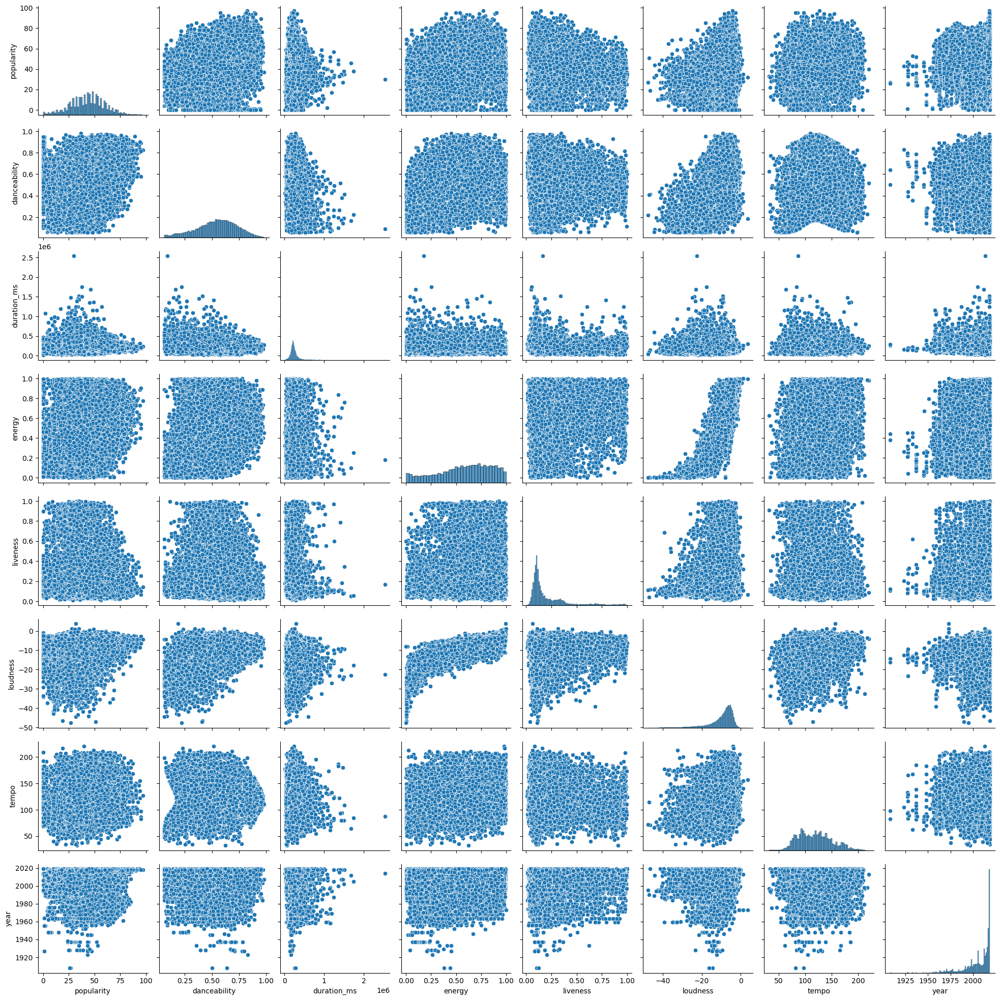

In [69]:
# pairplot
sns.pairplot(df)

C:\Users\tit_r\AppData\Local\Temp\ipykernel_16980\2636294033.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_corr = df.corr()


<Axes: >

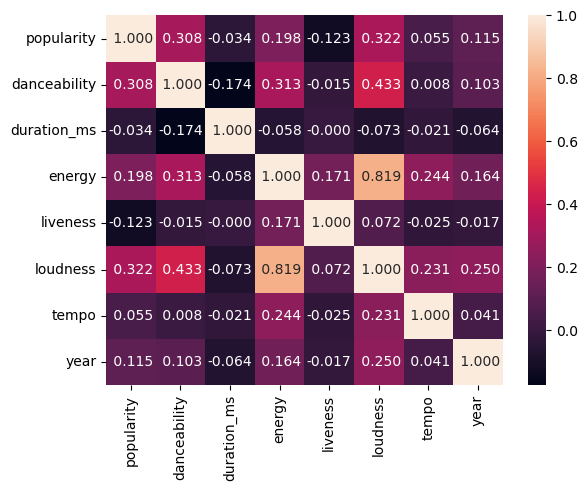

In [10]:
# matrice de corrélation
df_corr = df.corr()

sns.heatmap(df_corr, annot=True, fmt=' .3f')

In [33]:
fig = px.imshow(df_corr.round(3), zmin=-1, zmax=1, text_auto=True, aspect='auto',
               color_continuous_scale=px.colors.sequential.Plasma)

fig.update_layout(title='Carte de correlations')

fig.show()

In [6]:
# nb de morceaux par année 
fig_1 = px.histogram(df, x='year')

fig_1.update_layout(title='Nombre de titres par an', xaxis_title='Date',
                   yaxis_title='Nombre de titres')

fig_1.show()

In [59]:
# nb de morceaux par genre 

df_asc = df.copy()

df_asc = df_asc['genre'].sort_values(ascending=False)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', 
          '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#393b79', '#ffbb78', 
          '#2ca02c', '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5', 
          '#8c564b', '#c49c94', '#f7b6d2', '#7f7f7f', '#c7c7c7', '#bcbd22', 
          '#dbdb8d']


fig_2 = px.histogram(df_asc, x='genre', text_auto=True)

fig_2.update_layout(title='Nombre de titres par genre', xaxis_title='genre', 
                    yaxis_title='Nombre de titres')


fig_2.update_xaxes(categoryorder="total descending")

fig_2.show()

In [42]:
# nb de morceaux par genre 

df_1 = df.copy()

df_1['decennie'] = df_1['year'] // 10 * 10

fig_x = px.histogram(df_1, x='genre', animation_frame='decennie')

fig_x.update_layout(title='Nombre de titres par genre', xaxis_title='genre',
                   yaxis_title='Nombre de titres')

fig_x.update_yaxes(range=[0,400])

fig_x.show()

In [8]:
# loudness par an

df_mean = df.groupby('year').mean()
df_min = df.groupby('year').min()
df_max = df.groupby('year').max()

fig_3 = px.line(df_mean, y='tempo', title='tempo over time')


fig_3.show()

C:\Users\tit_r\AppData\Local\Temp\ipykernel_22180\3517688040.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [10]:
# durée par année

fig_4 = px.line(df_mean, y='duration_ms')

fig_4.update_layout(title="Évolution de la durée selon l'année", xaxis_title='Année',
                   yaxis_title='Durée en ms')

fig_4.show()

In [14]:
# boite à moustache par genres

fig_5 = px.box(df, y='duration_ms', points=False)

fig_5.update_layout(title='Durée des titres', yaxis_title='Durée en ms')

fig_5.show()

In [36]:
# boite à moustache par genres

fig_6 = px.box(df, y='duration_ms',  animation_frame='genre', points=False)

fig_6.update_layout(title='Durée des titres par genre', xaxis_title='Genres', 
                    yaxis_title='Durée en ms')

fig_6.update_yaxes(range=[0, 2700000])

fig_6.show()